## Question 8: How many core nodes are there in the Facebook network. What is the average degree of the core nodes?

In [1]:
library(igraph)


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union



In [2]:
g = read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)

In [3]:
num_cn <- sum(degree(g)>200)

In [4]:
core_node_indices <- degree(g)>200

In [5]:
core_node_degree = degree(g)[core_node_indices]

In [6]:
sum(core_node_degree)/num_cn

[1] 279.375

## Question 9: For each of the above core node’s personalized network, find the community structure using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare the modularity scores of the algorithms. For visualization purpose, display the community structure of the core node’s personalized networks using colors. Nodes belonging to the same community should have the same color and nodes belonging to different communities should have different color. In this question, you should have 15 plots in total.

In [7]:
modularity_scores = function(corenode, g){
    pn = induced.subgraph(g, c(corenode, neighbors(g,corenode)))
    layout1 = layout.fruchterman.reingold(pn)
    
    fg = fastgreedy.community(pn)
    filename = paste('fig_fastgreedy_', corenode,'.pdf',sep="")
    pdf(filename)
    plot(fg, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    dev.off()
    plot(fg, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    print(modularity(pn, membership(fg)))
    
    eb = edge.betweenness.community(pn)
    filename = paste('fig_edge_betweenness_', corenode,'.pdf',sep="")
    pdf(filename)
    plot(eb, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    dev.off()
    plot(eb, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    print(modularity(pn, membership(eb)))
    
    infomap = cluster_infomap(pn)
    filename = paste('fig_infomap_', corenode,'.pdf',sep="")
    pdf(filename)
    plot(infomap, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    dev.off()
    plot(infomap, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    print(modularity(pn, membership(infomap)))
}

[1] 0.4131014
[1] 0.3533022


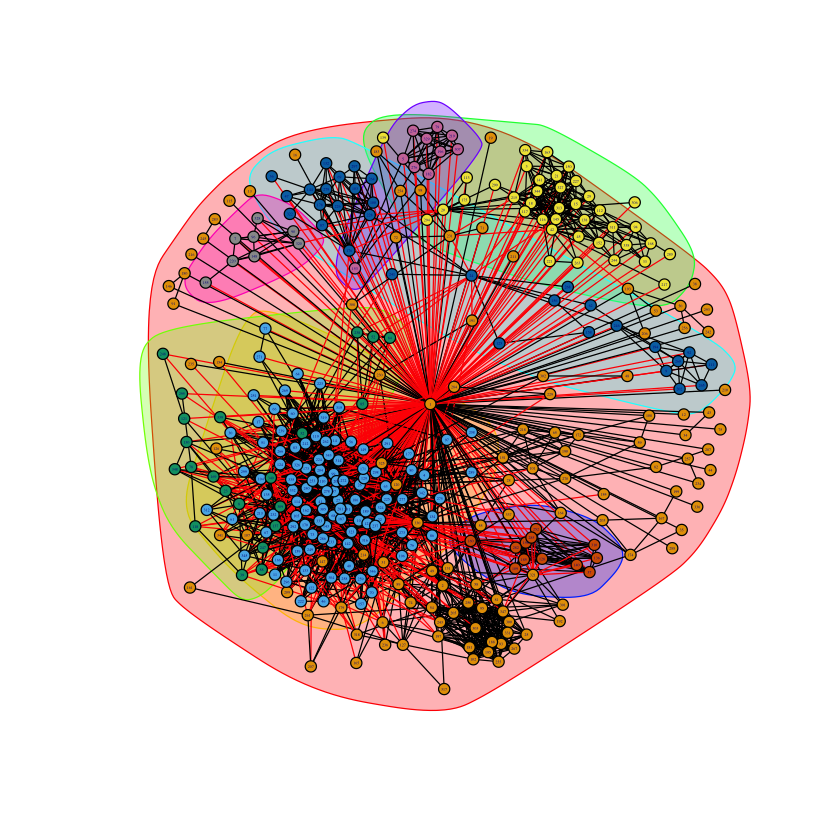

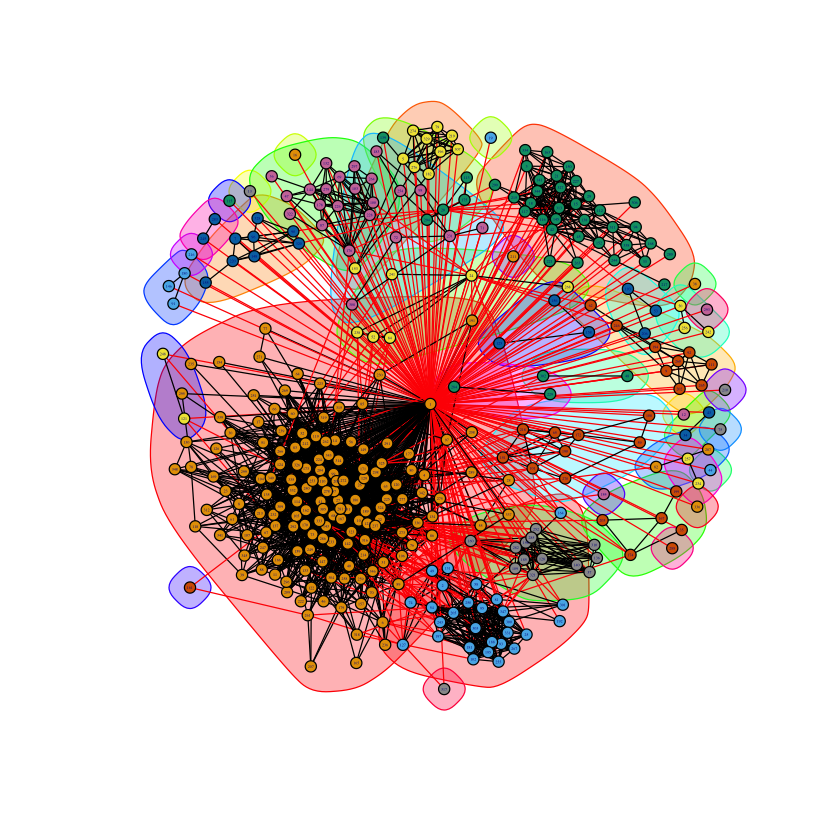

[1] 0.3891185


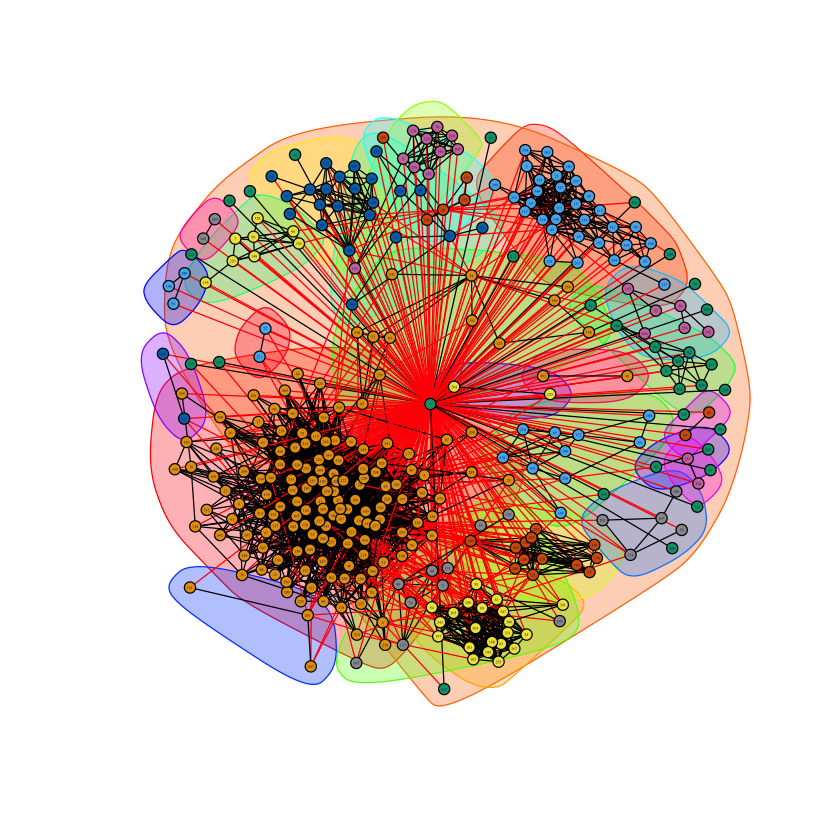

In [8]:
modularity_scores(1, g)

In [ ]:
modularity_scores(108, g)

[1] 0.2517149
[1] 0.133528


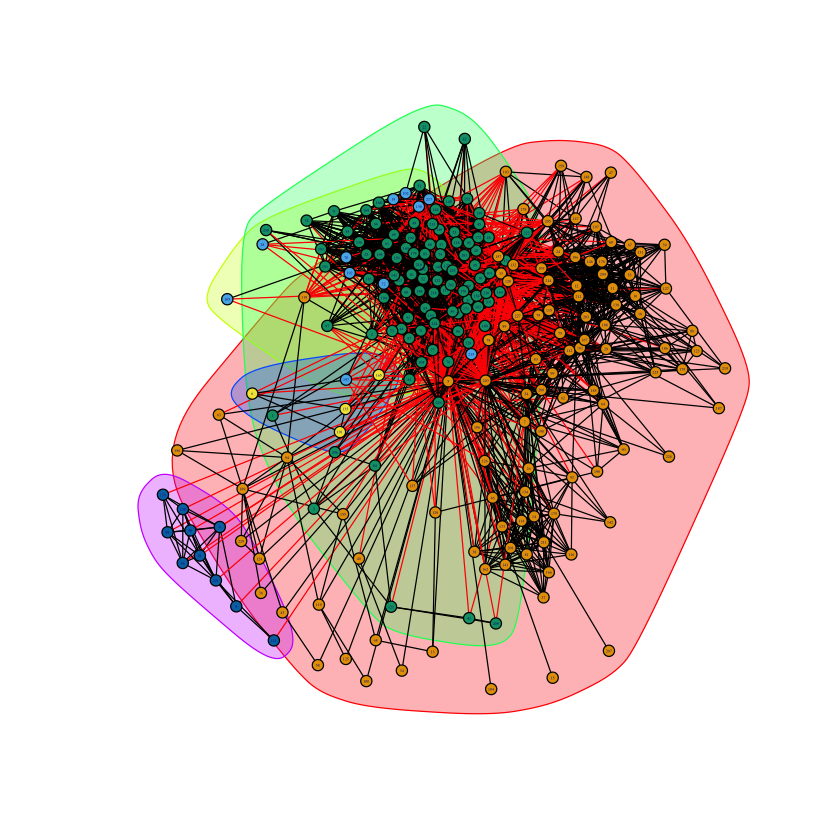

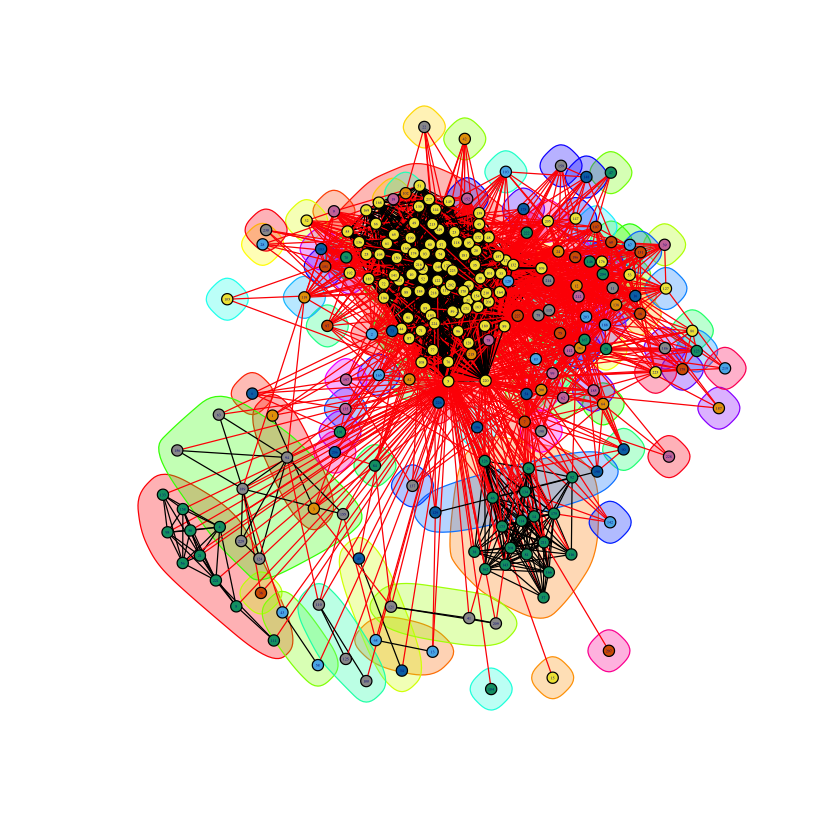

[1] 0.09602908


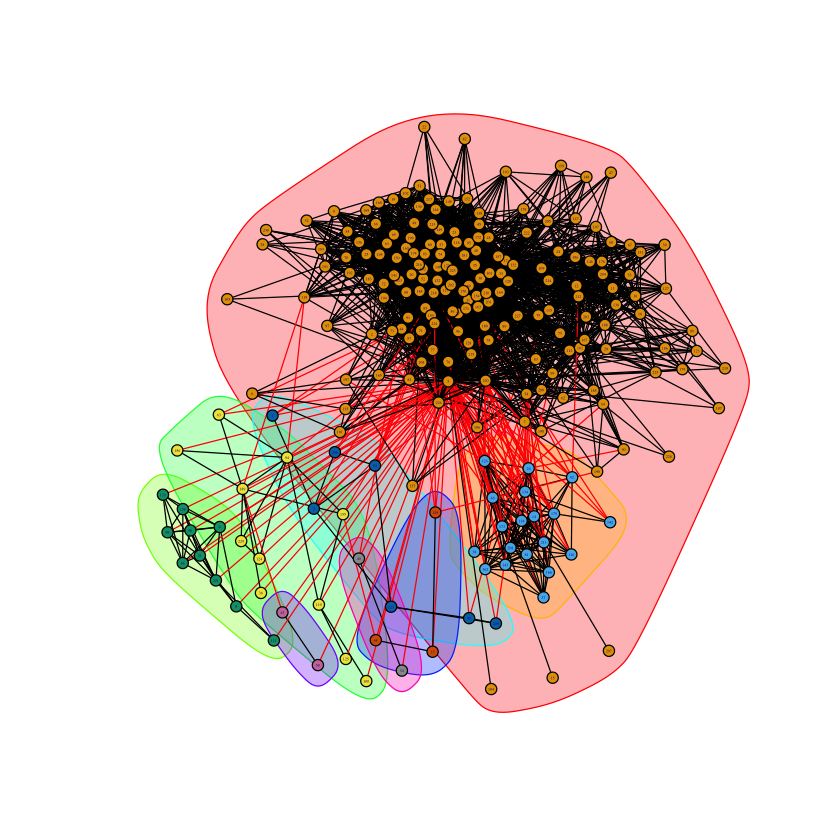

In [36]:
modularity_scores(349, g)

[1] 0.5070016
[1] 0.4890952


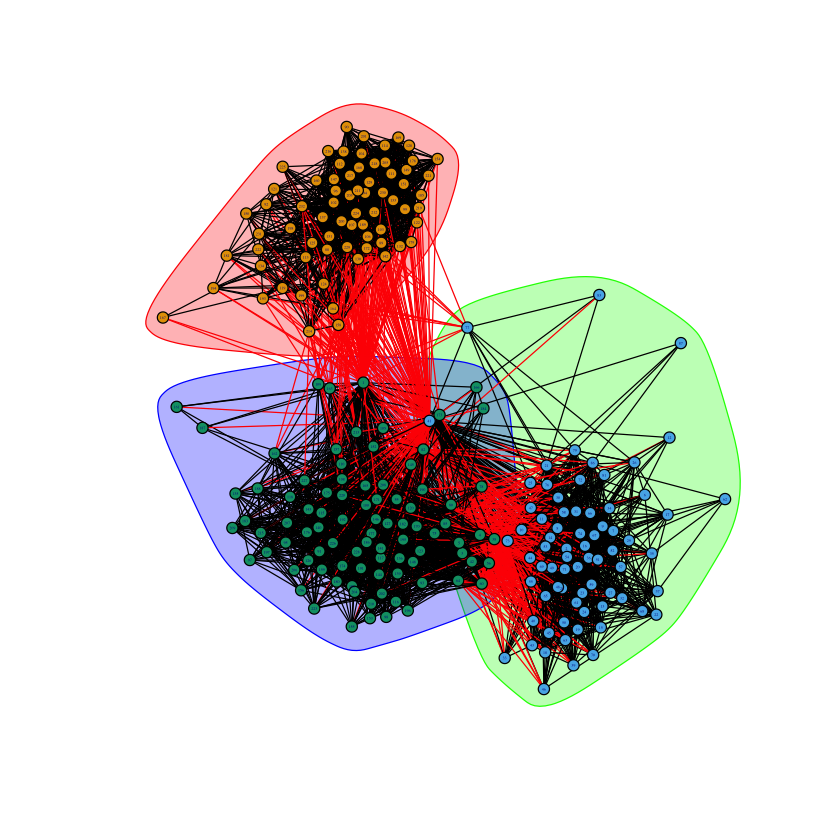

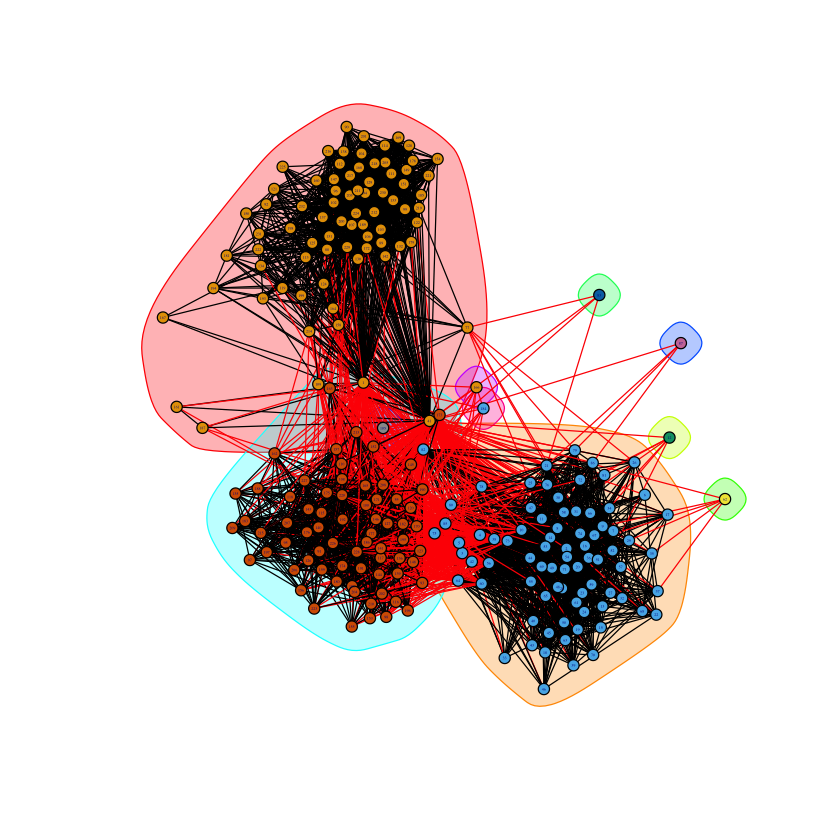

[1] 0.5152788


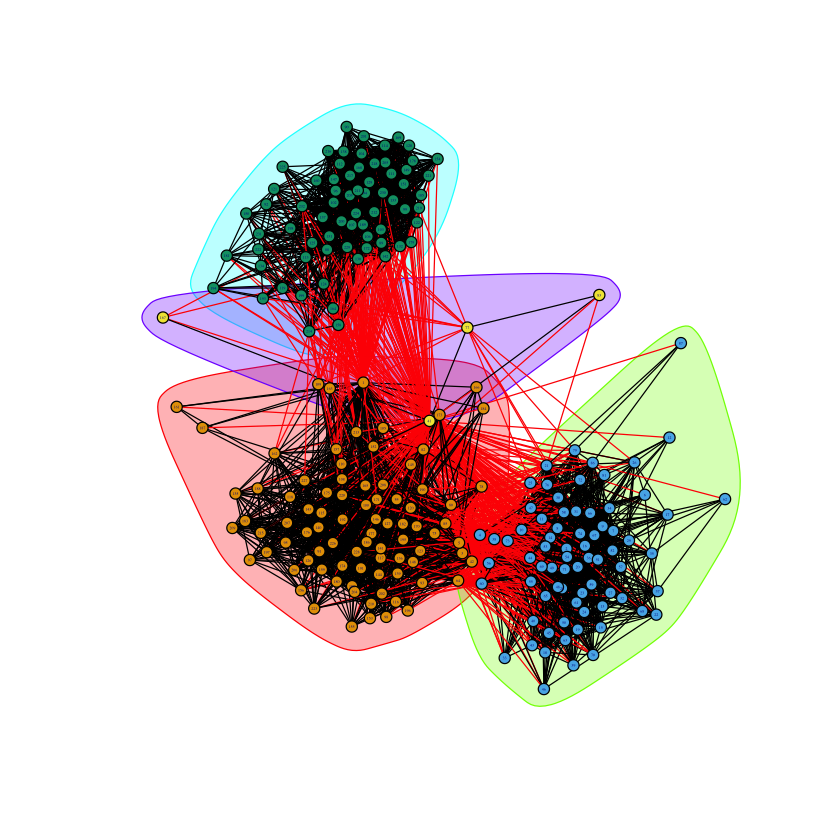

In [37]:
modularity_scores(484, g)

[1] 0.1455315
[1] 0.02762377


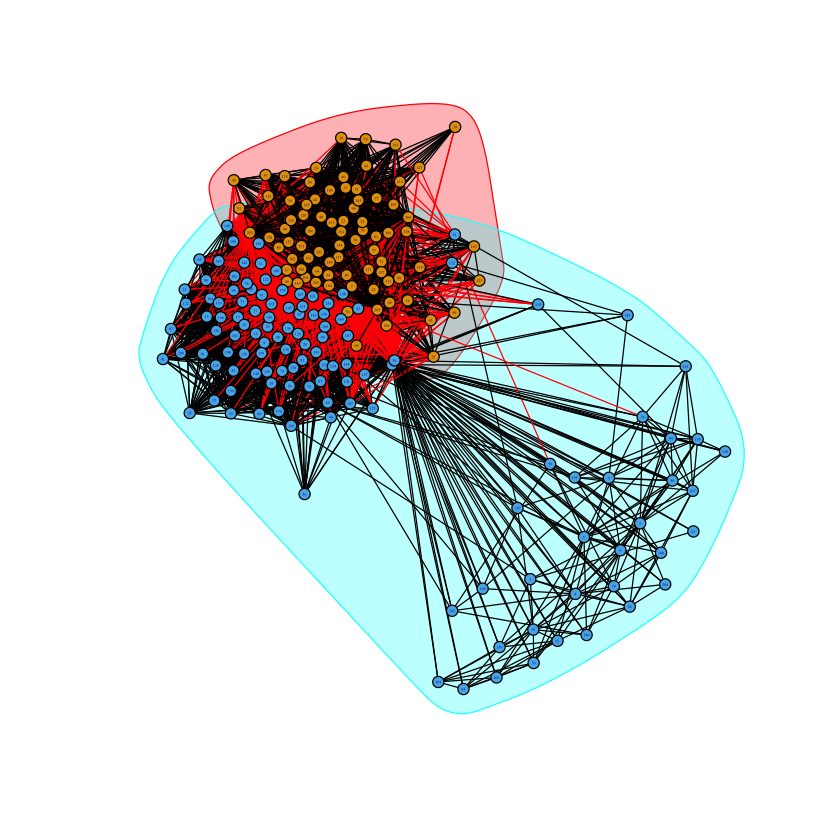

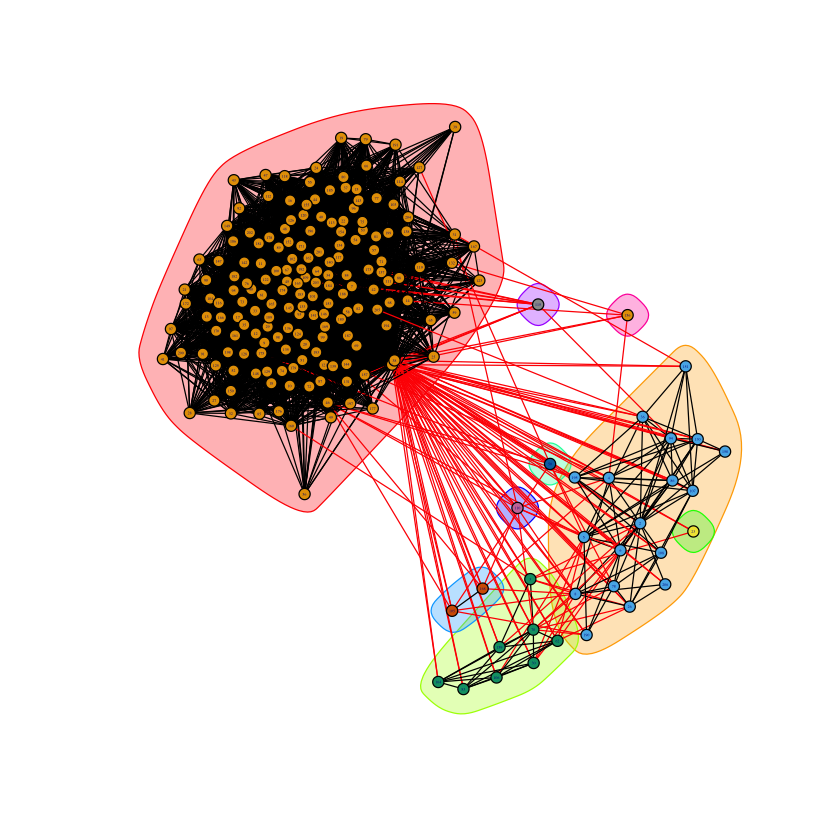

[1] 0.02690662


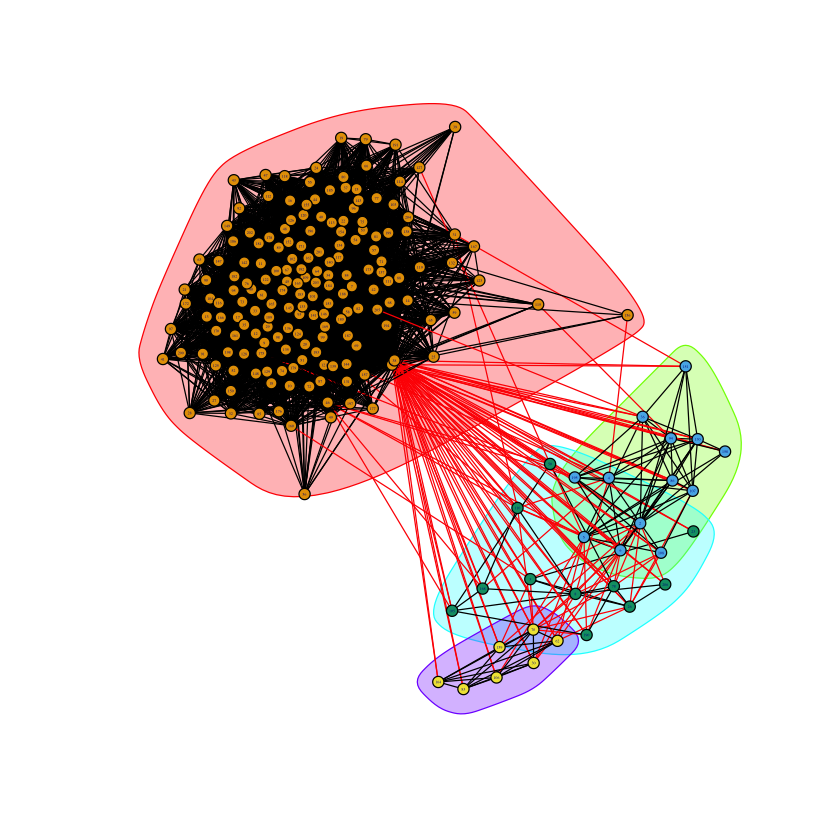

In [38]:
modularity_scores(1087, g)

## Question 10: For each of the core node’s personalized network(use same core nodes as question 9), remove the core node from the personalized network and find the community structure of the modified personalized network. Use the same community detection algorithm as question 9. Compare the modularity score of the community structure of the modi- fied personalized network with the modularity score of the community structure of the personalized network of question 9. For visualization purpose, display the community structure of the modified personalized network using colors. In this question, you should have 15 plots in total.

In [ ]:
modified_modularity_scores = function(corenode, g){
    pn = induced.subgraph(g, c(neighbors(g,corenode)))
    layout1 = layout.fruchterman.reingold(pn)
    
    fg = fastgreedy.community(pn)
    filename = paste('fig_fastgreedy_mod_', corenode,'.pdf',sep="")
    pdf(filename)
    plot(fg, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    dev.off()
    plot(fg, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    print(modularity(pn, membership(fg)))
    
    eb = edge.betweenness.community(pn)
    filename = paste('fig_edge_betweenness_mod_', corenode,'.pdf',sep="")
    pdf(filename)
    plot(eb, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    dev.off()
    plot(eb, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    print(modularity(pn, membership(eb)))
    
    infomap = cluster_infomap(pn)
    filename = paste('fig_infomap_mod_', corenode,'.pdf',sep="")
    pdf(filename)
    plot(infomap, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    dev.off()
    plot(infomap, pn, layout=layout1, vertex.size=4, vertex.label.cex=0.2)
    print(modularity(pn, membership(infomap)))
}

[1] 0.4418533
[1] 0.4161461


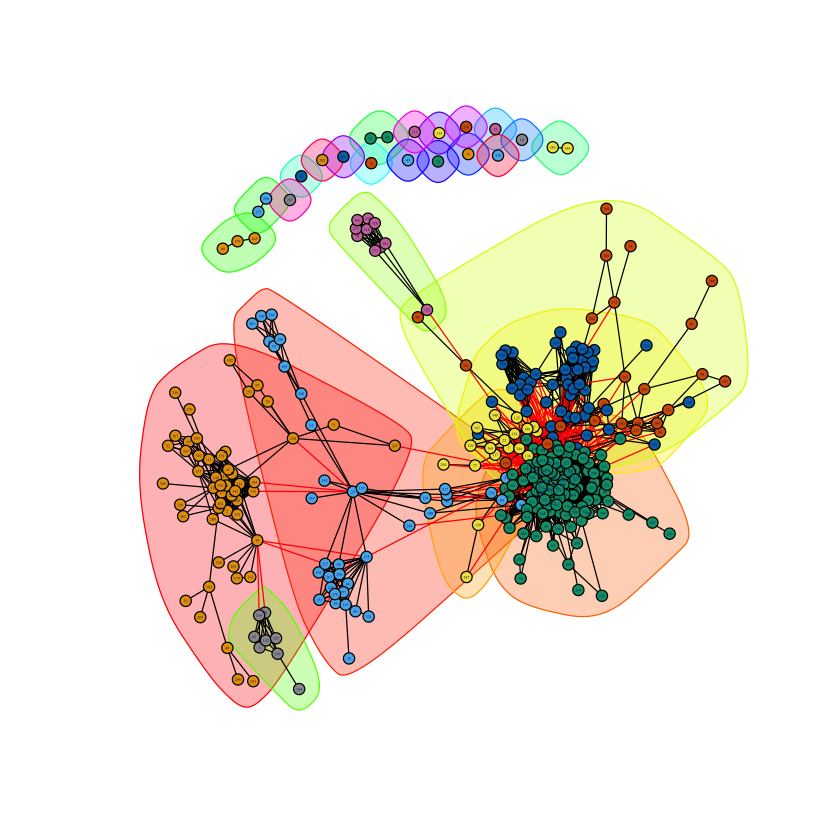

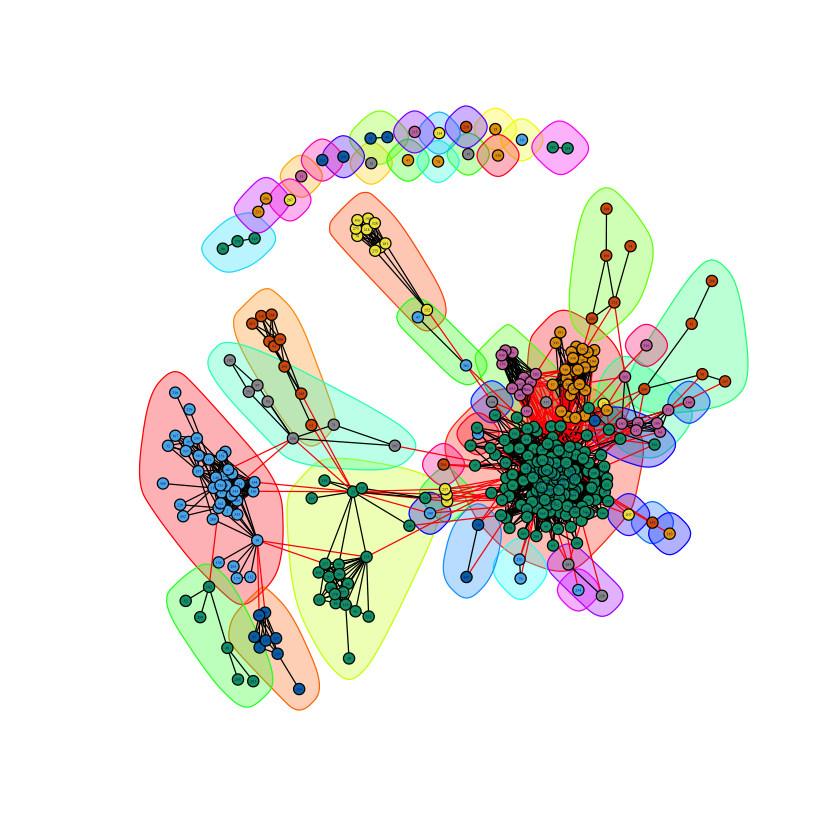

[1] 0.4180077


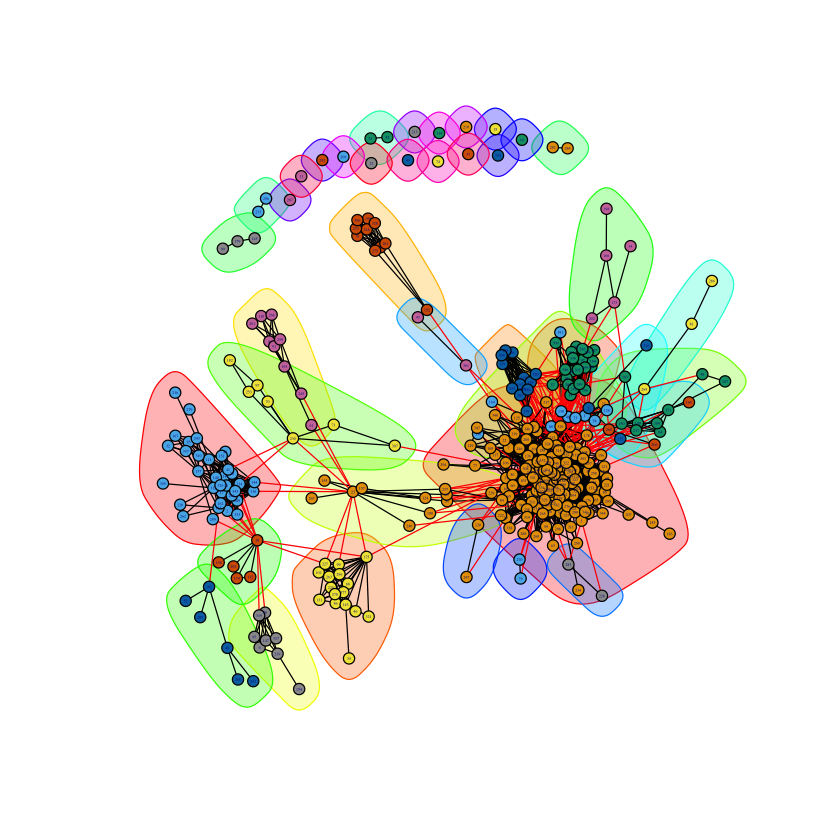

In [42]:
modified_modularity_scores(1, g)

In [ ]:
modified_modularity_scores(108, g)

[1] 0.2456918
[1] 0.1505663


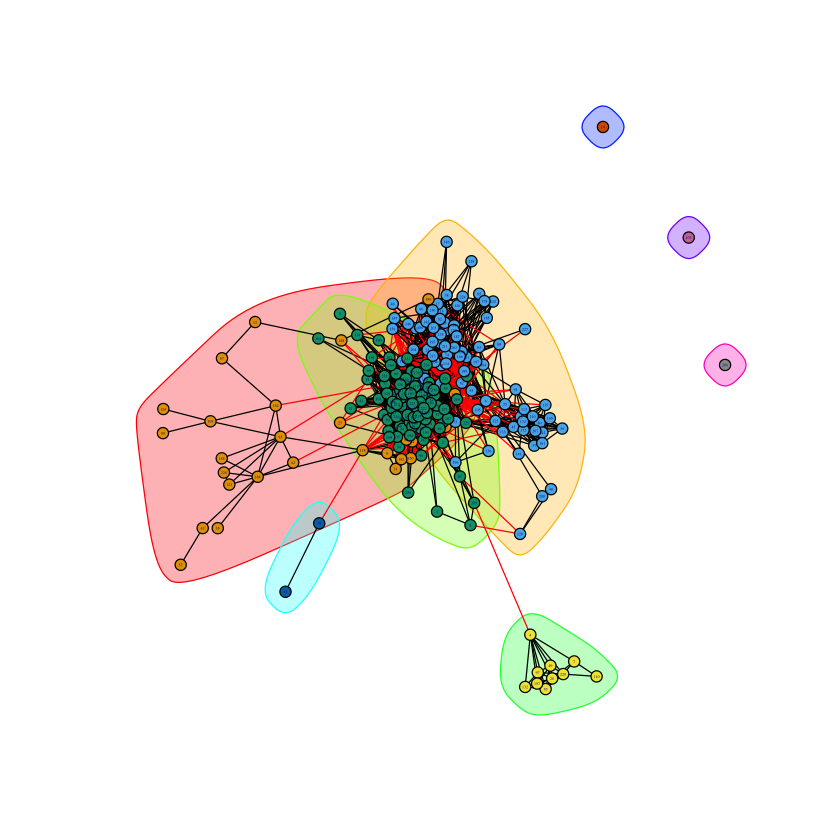

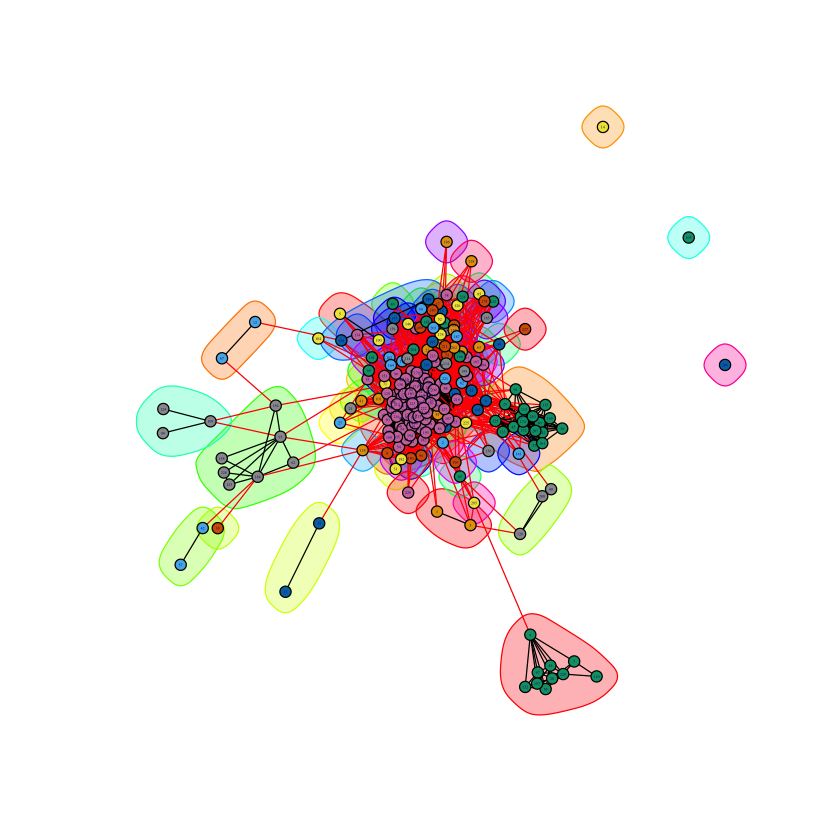

[1] 0.2337732


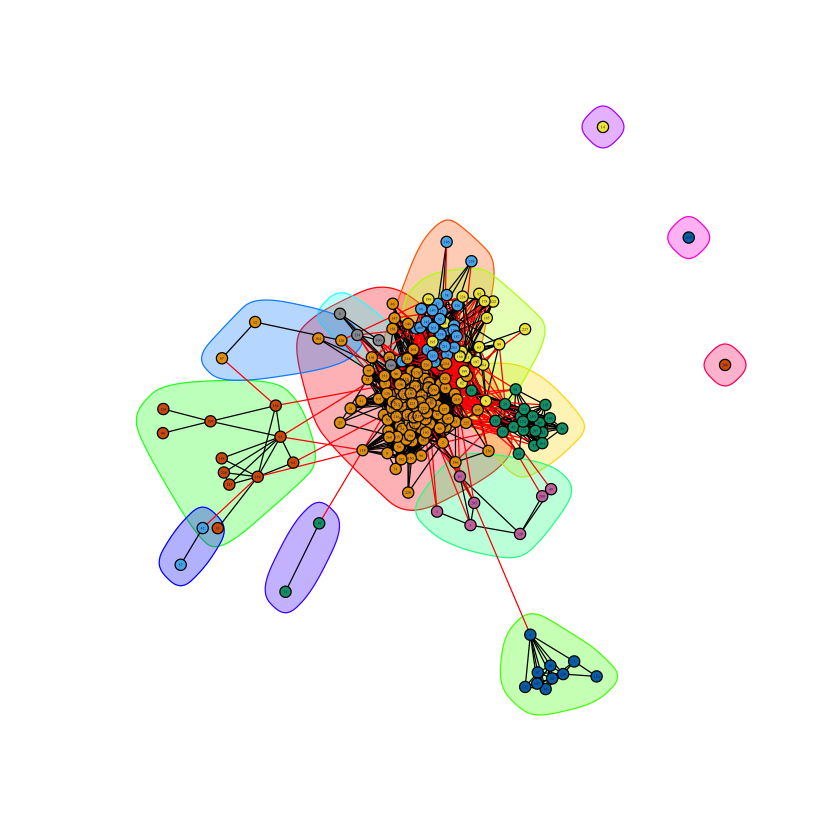

In [43]:
modified_modularity_scores(349, g)

[1] 0.5342142
[1] 0.5154413


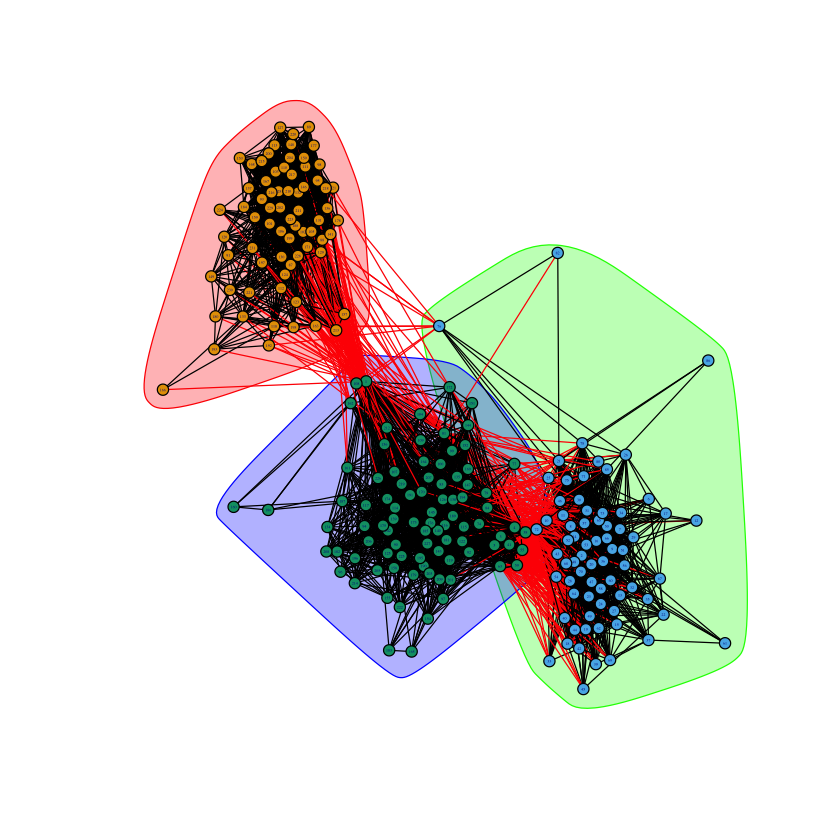

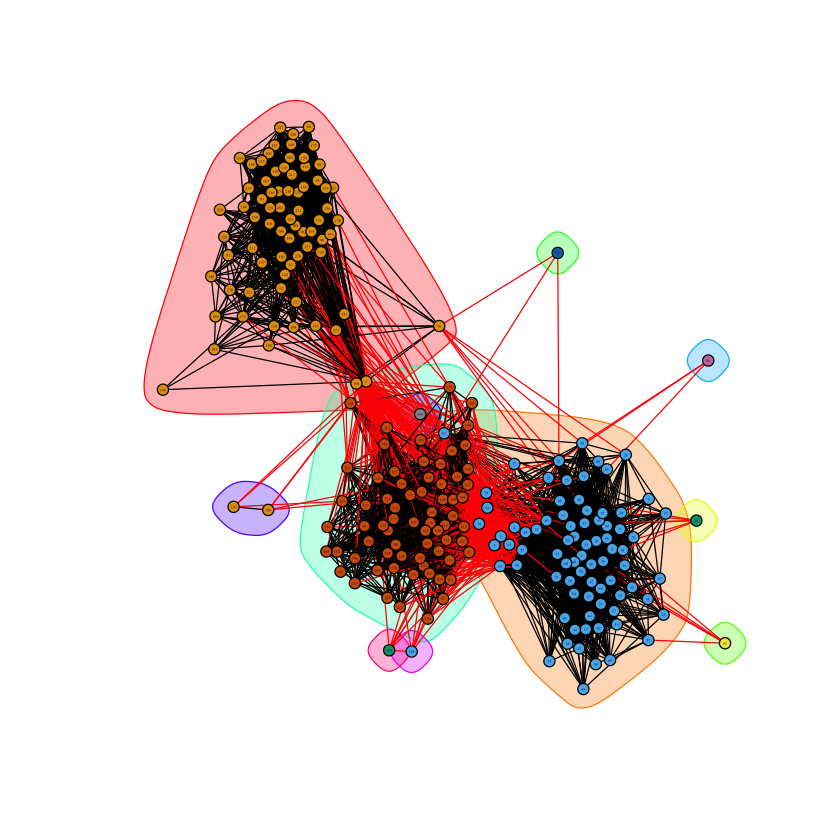

[1] 0.5434437


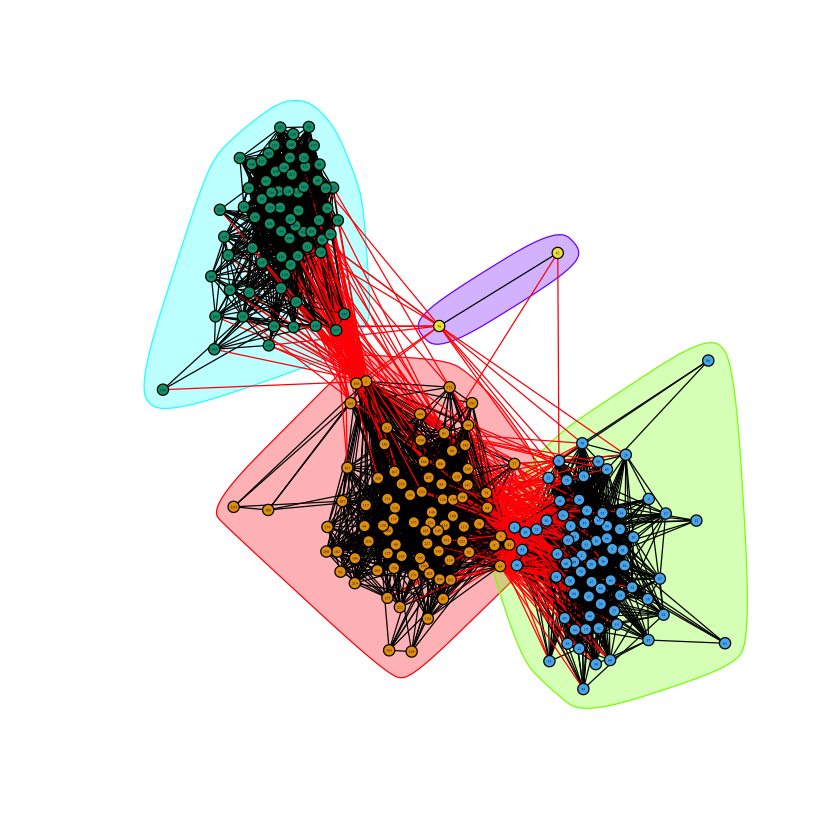

In [44]:
modified_modularity_scores(484, g)

[1] 0.1481956
[1] 0.0324953


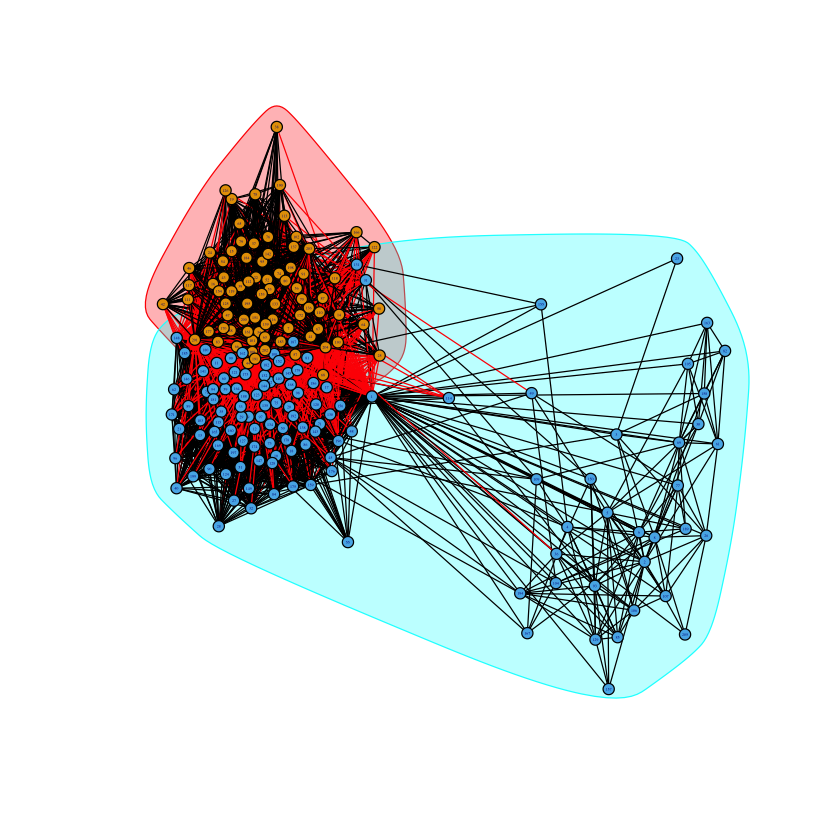

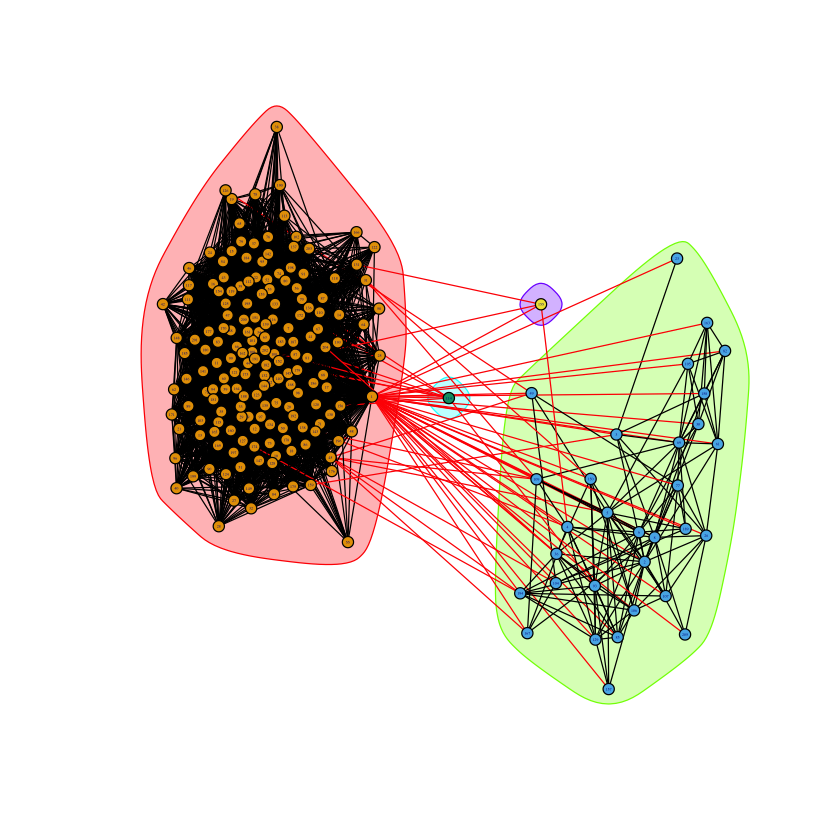

[1] 0.02737159


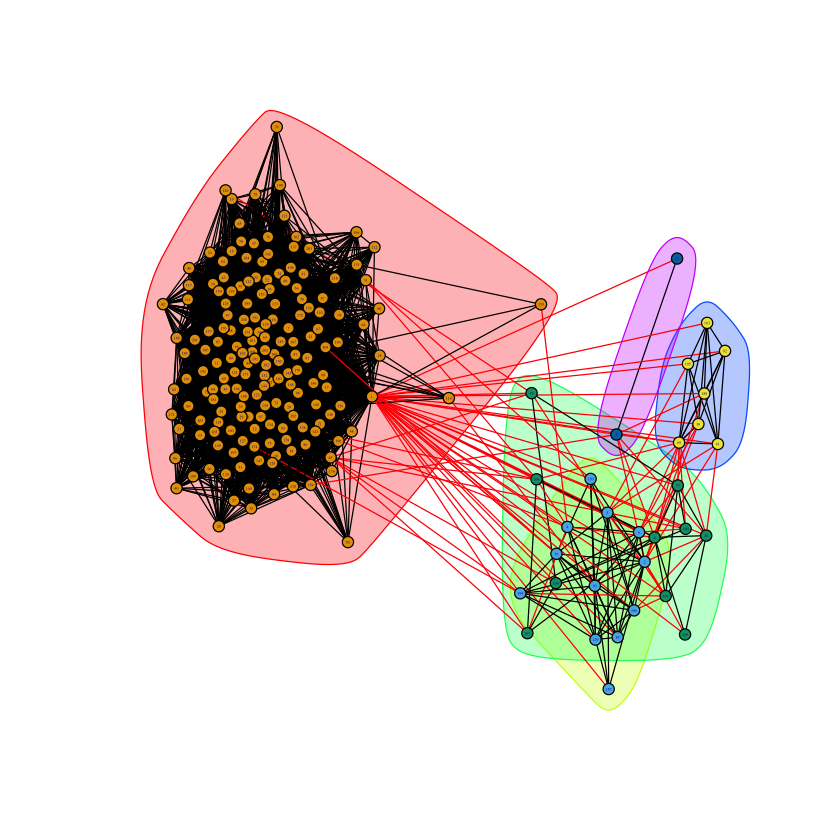

In [45]:
modified_modularity_scores(1087, g)

## Question 11: Write an expression relating the Embeddedness of a node to it’s degree.

In [ ]:
Embeddedness = degree - 1

## Question 12: For each of the core node’s personalized network (use the same core nodes as question 9), plot the distribution of embeddedness and dispersion. In this question, you will have 10 plots.

In [95]:
calculate_dispersion = function(core_node, g, v){
    mod_personalized <- induced.subgraph(g, c(neighbors(g,core_node)))
    #common_neighbors <- delete.vertices(mod_personalized,v)
    common_neighbors <- induced.subgraph(mod_personalized, c(neighbors(mod_personalized,v)))
    num_com_neighbors <- length(V(common_neighbors))
    D <- diameter(mod_personalized)
    dis <- 0
    for (y in 1:num_com_neighbors){
        shortest_path <- shortest.paths(common_neighbors, y, mode = "all")
        indices <- (shortest_path==Inf)
        shortest_path[indices] <- D+1
        dis <- dis + sum(shortest_path[y:num_com_neighbors])
    }
    return (dis)
}

In [108]:
core_node <- 1
v <- 322
    mod_personalized <- induced.subgraph(g, c(neighbors(g,core_node)))
    #common_neighbors <- delete.vertices(mod_personalized,v)
    common_neighbors <- induced.subgraph(mod_personalized, c(neighbors(mod_personalized,v)))
    num_com_neighbors <- length(V(common_neighbors))
    D <- diameter(mod_personalized)
    dis <- 0
    for (y in 1:num_com_neighbors){
        shortest_path <- shortest.paths(common_neighbors, y, mode = "all")
        indices <- (shortest_path==Inf)
        shortest_path[indices] <- D+1
        dis <- dis + sum(shortest_path[y:num_com_neighbors])
    }
dis
calculate_dispersion(core_node, g, v)


num_neighbors <- length(neighbors(g, core_node))
dispersion <- rep(0,num_neighbors)
num_neighbors
for (x in 1:num_neighbors){
        dispersion[x] <- calculate_dispersion(core_node, g, x)
}
dispersion

[1] 4619

[1] 4619

[1] 347

ERROR: Error in shortest.paths(common_neighbors, y, mode = "all"): At iterators.c:759 : Cannot create iterator, invalid vertex id, Invalid vertex id


In [101]:
plot_embeddedness_dispersion = function(core_node, g){
    mod_personalized <- induced.subgraph(g, c(neighbors(g,core_node)))

    filename = paste('fig_embeddedness_', core_node,'.pdf',sep="")
    pdf(filename)
    plot(degree.distribution(mod_personalized),main="Embeddedness distribution of the network",xlab="Embeddedness",ylab="Frequency")
    dev.off()
    plot(degree.distribution(mod_personalized),main="Embeddedness distribution of the network",xlab="Embeddedness",ylab="Frequency")  

    num_neighbors <- length(neighbors(g, core_node))
    dispersion <- rep(0,num_neighbors)
    
    for (x in 1:num_neighbors){
        x
        dispersion[x] <- calculate_dispersion(core_node, g, x)
    }
    h = hist(dispersion, breaks=50, plot=FALSE); # or hist(x,plot=FALSE) to avoid the plot of the histogram
    h$density = h$counts/sum(h$counts)
    
    filename = paste('fig_dispersion_', core_node,'.pdf',sep="")
    pdf(filename)
    plot(h,freq=FALSE,main="Dispersion distribution of the network",xlab="Dispersion",ylab="Frequency")
    dev.off()
    plot(h,freq=FALSE,main="Dispersion distribution of the network",xlab="Dispersion",ylab="Frequency")
}

ERROR: Error in shortest.paths(common_neighbors, y, mode = "all"): At iterators.c:759 : Cannot create iterator, invalid vertex id, Invalid vertex id


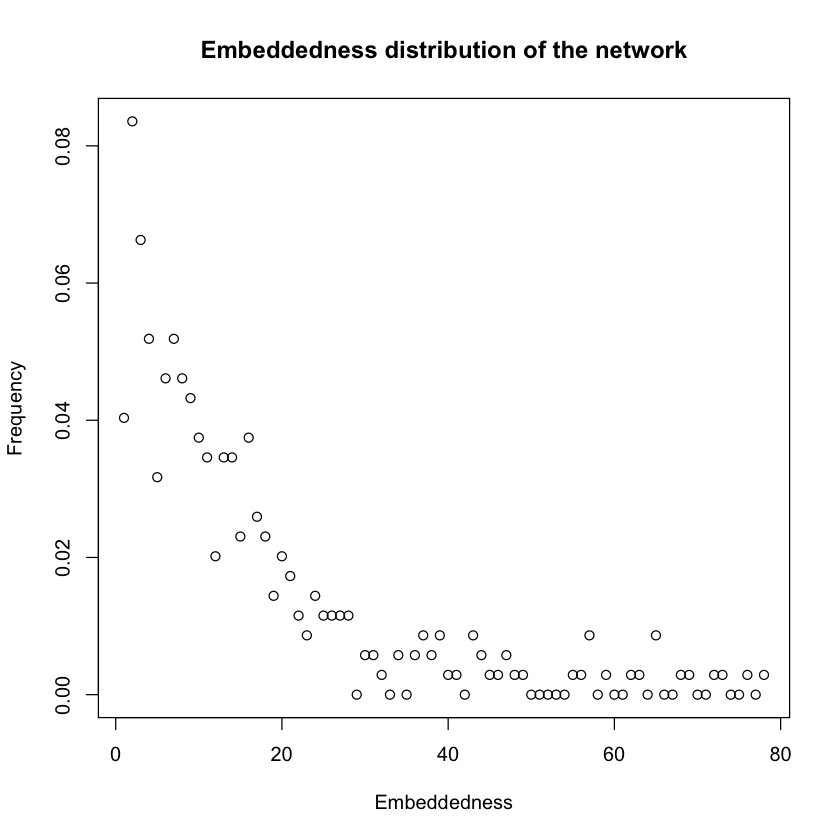

In [102]:
plot_embeddedness_dispersion(1, g)

In [ ]:
plot_embeddedness_dispersion(108, g)

ERROR: Error in shortest.paths(common_neighbors, x, mode = "all"): At iterators.c:759 : Cannot create iterator, invalid vertex id, Invalid vertex id


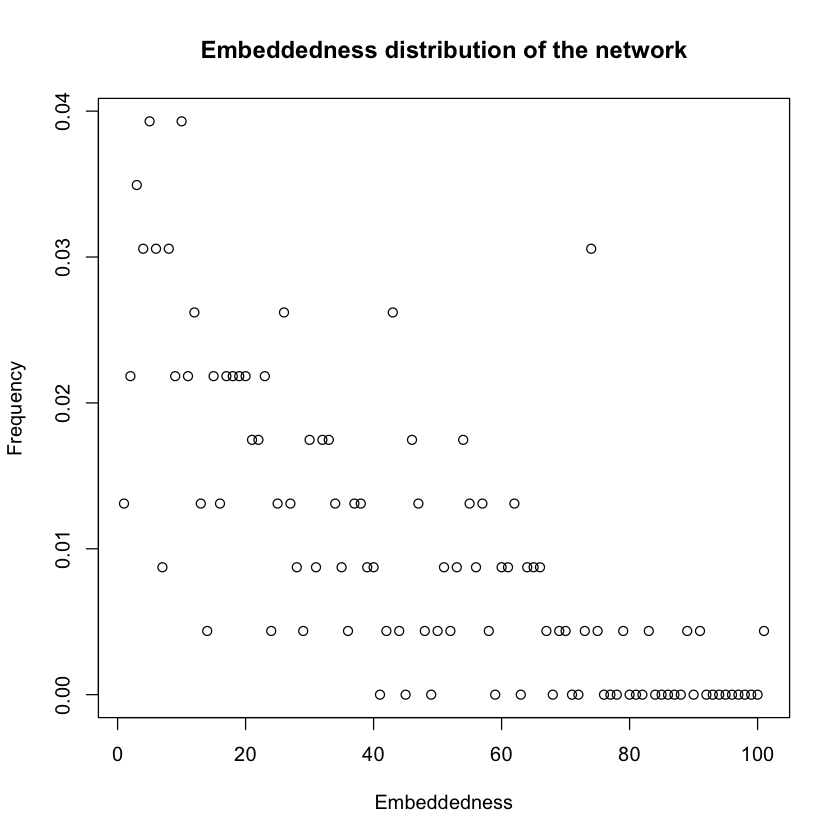

In [30]:
plot_embeddedness_dispersion(349, g)

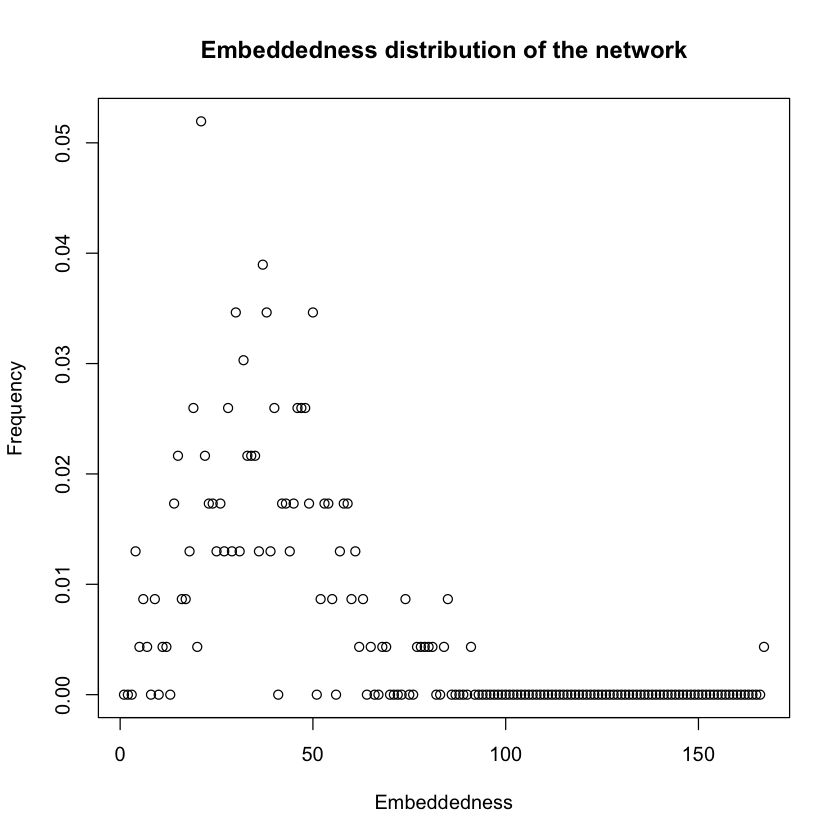

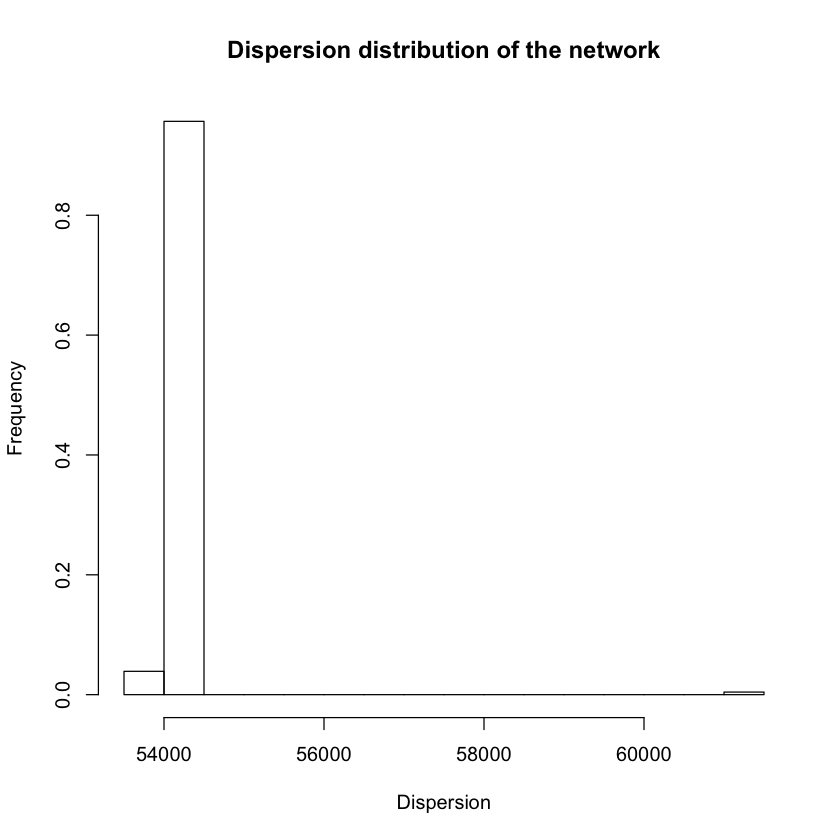

In [30]:
plot_embeddedness_dispersion(484, g)

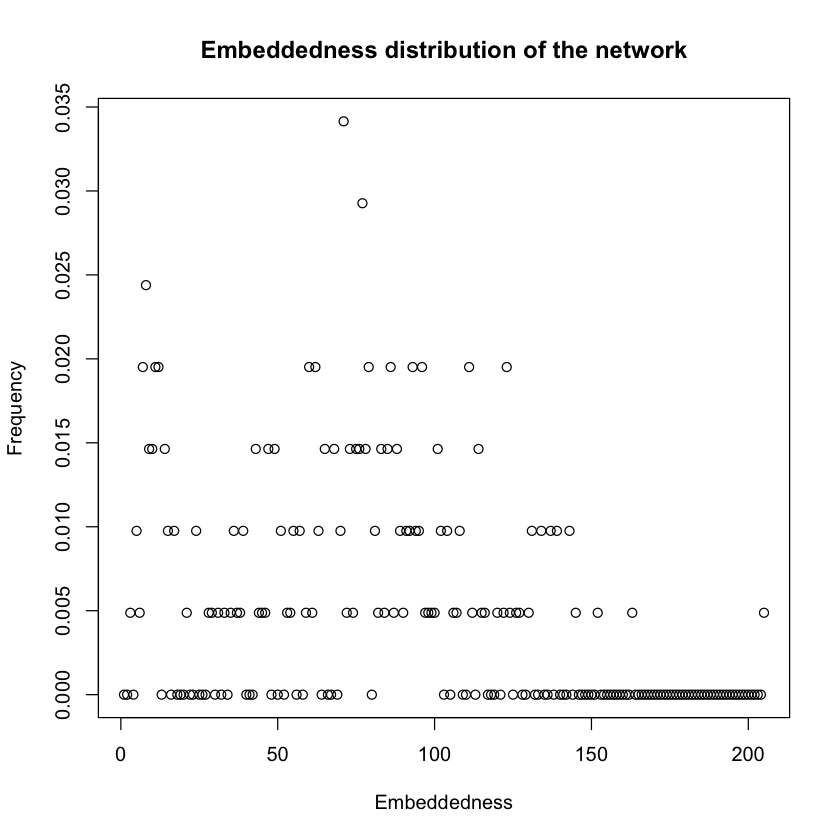

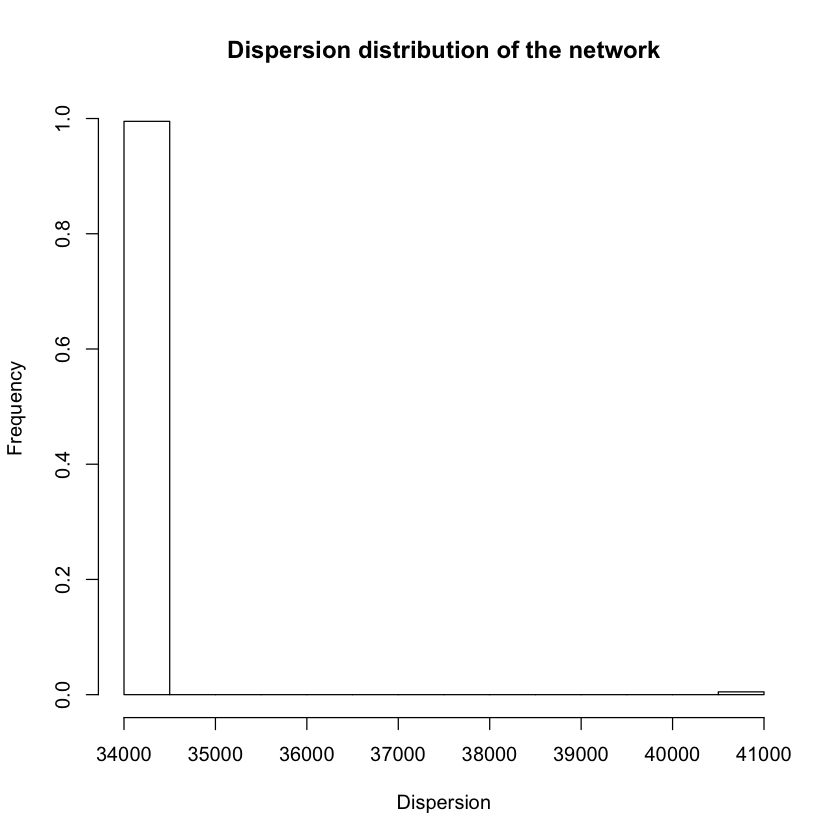

In [31]:
plot_embeddedness_dispersion(1087, g)